# Utilização de Dataset disponível no Kaggle para análise exploratória de dados vacinação Covid 19

Disponível em: https://www.kaggle.com/priteshraj10/covid-vaccination-all-countries-data

## Exploração dos dados

In [1]:
#Pacotes necessários 
!pip install plotly==5.3.0

In [16]:
#Imports necessários

import os
import subprocess
import stat
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
import colorsys
plt.style.use('seaborn-talk')
%matplotlib inline

In [3]:
#Dataset carregado
covid_data_path = "dataset/vaccinations.csv"
df = pd.read_csv(covid_data_path,encoding = "latin-1")

In [4]:
print(df.head())

      location iso_code        date  total_vaccinations  people_vaccinated  \
0  Afghanistan      AFG  2021-02-22                 0.0                0.0   
1  Afghanistan      AFG  2021-02-23                 NaN                NaN   
2  Afghanistan      AFG  2021-02-24                 NaN                NaN   
3  Afghanistan      AFG  2021-02-25                 NaN                NaN   
4  Afghanistan      AFG  2021-02-26                 NaN                NaN   

   people_fully_vaccinated  total_boosters  daily_vaccinations_raw  \
0                      NaN             NaN                     NaN   
1                      NaN             NaN                     NaN   
2                      NaN             NaN                     NaN   
3                      NaN             NaN                     NaN   
4                      NaN             NaN                     NaN   

   daily_vaccinations  total_vaccinations_per_hundred  \
0                 NaN                             0.0

In [5]:
df

,location,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,daily_vaccinations_per_million
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,NaN,0.00,0.00,NaN,NaN,NaN
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,34.0
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,34.0
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,34.0
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,NaN,34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43434,Zimbabwe,ZWE,2021-08-24,3889424.0,2382059.0,1507365.0,NaN,60413.0,62638.0,25.77,15.78,9.99,NaN,4150.0
43435,Zimbabwe,ZWE,2021-08-25,4015517.0,2453229.0,1562288.0,NaN,126093.0,67597.0,26.61,16.25,10.35,NaN,4479.0
43436,Zimbabwe,ZWE,2021-08-26,NaN,NaN,NaN,NaN,NaN,60688.0,NaN,NaN,NaN,NaN,4021.0
43437,Zimbabwe,ZWE,2021-08-27,4075995.0,2491680.0,1584315.0,NaN,NaN,53784.0,27.01,16.51,10.50,NaN,3564.0


In [6]:
print(df.describe())

       total_vaccinations  people_vaccinated  people_fully_vaccinated  \
count        2.521400e+04       2.423200e+04             2.115800e+04   
mean         6.646232e+07       3.662570e+07             2.175827e+07   
std          3.196583e+08       1.781504e+08             1.042816e+08   
min          0.000000e+00       0.000000e+00             1.000000e+00   
25%          2.308280e+05       1.808305e+05             8.515675e+04   
50%          1.752942e+06       1.167180e+06             7.209695e+05   
75%          1.047914e+07       6.455442e+06             4.480053e+06   
max          5.213176e+09       3.118470e+09             2.091593e+09   

       total_boosters  daily_vaccinations_raw  daily_vaccinations  \
count    5.130000e+02            2.121100e+04        4.317200e+04   
mean     2.706016e+06            9.839917e+05        4.857091e+05   
std      3.139392e+06            3.966181e+06        2.738164e+06   
min      1.600000e+01            0.000000e+00        0.000000e+00 

In [7]:
#Lista colunas do dataset
list(df)

['location',
 'iso_code',
 'date',
 'total_vaccinations',
 'people_vaccinated',
 'people_fully_vaccinated',
 'total_boosters',
 'daily_vaccinations_raw',
 'daily_vaccinations',
 'total_vaccinations_per_hundred',
 'people_vaccinated_per_hundred',
 'people_fully_vaccinated_per_hundred',
 'total_boosters_per_hundred',
 'daily_vaccinations_per_million']

In [8]:
#Verifica valores missing (null)
df.isna().mean().to_frame()

,0
location,0.000000
iso_code,0.000000
date,0.000000
total_vaccinations,0.419554
people_vaccinated,0.442160
people_fully_vaccinated,0.512926
total_boosters,0.988190
daily_vaccinations_raw,0.511706
daily_vaccinations,0.006147
total_vaccinations_per_hundred,0.419554


In [9]:
# Verifico os 10 locais mais frequentes
df['location'].value_counts().head(10)

High income         270
World               270
Europe              270
Norway              268
European Union      268
Latvia              267
England             263
Scotland            263
North America       258
Northern Ireland    258
Name: location, dtype: int64

In [10]:
#Verifico se há valores N/A para os países
df['location'].isnull().value_counts().head(10)

False    43439
Name: location, dtype: int64

In [11]:
#Verifico valoress missing locais/faço reducing se necessário
df['location'].sort_values().unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Cambodia', 'Cameroon', 'Canada', 'Cape Verde', 'Cayman Islands',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo', 'Cook Islands', 'Costa Rica', "Cote d'Ivoire",
       'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czechia',
       'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'England',
       'Equatorial Guinea', 'Estonia', 'Eswatini', 'Ethiopia', 'Europe',
 

In [12]:
#Visualizo vacinação global - mapa do mundo
import plotly.express as px
map_fig = px.scatter_geo(
    df, locations='iso_code', projection='orthographic',
    opacity=0.8, hover_name='location', hover_data=["total_vaccinations", "people_vaccinated", "people_fully_vaccinated", "total_boosters"],
)
map_fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



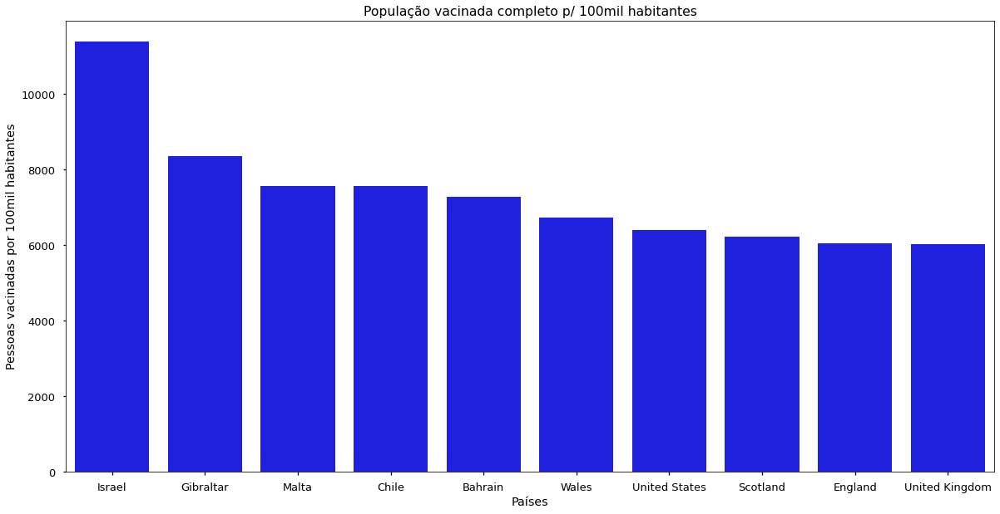

In [59]:
#Antes de analisar os dados e separar por continuentes gráfico com 10 maiores registros de população vacinada 
#Por 100mil habitantes global

total = df.groupby('location').sum().sort_values('people_fully_vaccinated_per_hundred', ascending = False)
total = total.iloc[:10]
total = total.sort_values('people_fully_vaccinated_per_hundred', ascending=False)

plt.figure(figsize = (20, 10))
sns.barplot(total.index, total.people_fully_vaccinated_per_hundred, color = 'b')

plt.title('População vacinada completo p/ 100mil habitantes')
plt.ylabel('Pessoas vacinadas por 100mil habitantes')
plt.xlabel('Países')
plt.show()

In [55]:
#Dados continentes e Brasil

asia = df.loc[df.location == 'Asia']
europe = df.loc[df.location == 'Europe']
north_america = df.loc[df.location == 'North America']
south_america = df.loc[df.location == 'South America']
africa = df.loc[df.location == 'Africa']
oceania = df.loc[df.location == 'Oceania']
antartica = None
brazil = df.loc[df.location == 'Brazil']
frame_compare = [asia, europe, north_america, south_america, africa, oceania, antartica]
result = pd.concat(frame_compare)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



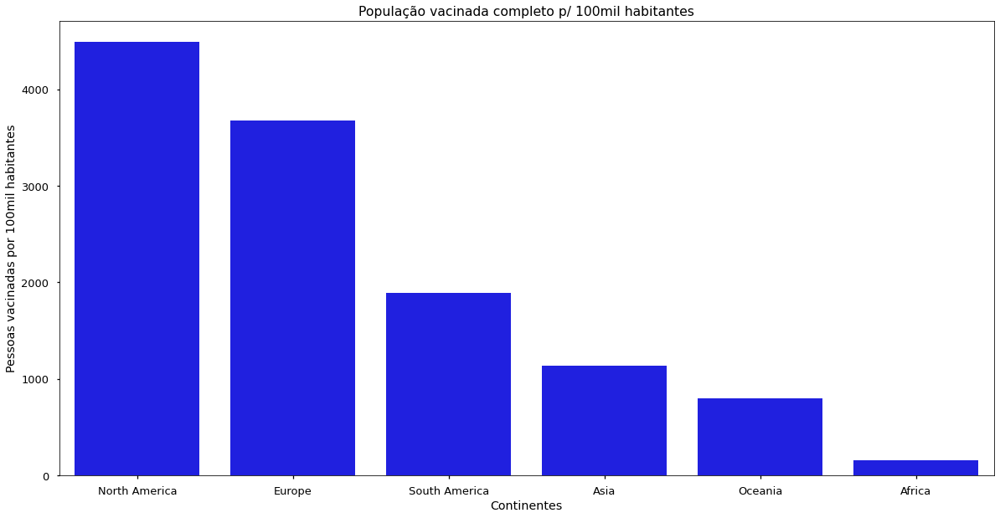

In [56]:
#Gráfico de barrra população vacinada (completo) por 100mil habitantes
vac_100 = result.groupby('location').sum().sort_values('people_fully_vaccinated_per_hundred', ascending = False)
plt.figure(figsize = (20, 10))
sns.barplot(vac_100.index, vac_100.people_fully_vaccinated_per_hundred, color = 'b')

plt.title('População vacinada completo p/ 100mil habitantes')
plt.ylabel('Pessoas vacinadas por 100mil habitantes')
plt.xlabel('Continentes')
plt.show()


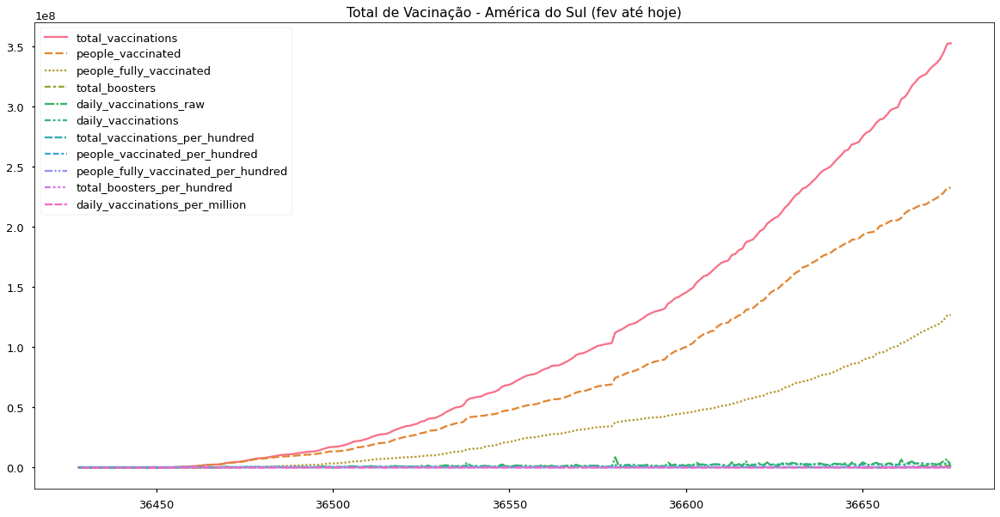

In [44]:
#Plotando dados total vacinado América do Sul

plt.figure(figsize=(20,10))
sns.lineplot(data=south_america.loc['2021-02-22':])
plt.title('Total de Vacinação - América do Sul (fev até hoje)')
plt.show()

In [ ]:
#Gráfico de análise países américa do Sul - taxa de 100mil habitantes vacinados
south = south_america.groupby('location').sum().sort_values('people_fully_vaccinated_per_hundred', ascending = False)

plt.figure(figsize = (20, 10))
sns.barplot(south.index, south.people_fully_vaccinated_per_hundred, color = 'b')

plt.title('População vacinada completo p/ 100mil habitantes')
plt.ylabel('Pessoas vacinadas por 100mil habitantes')
plt.xlabel('Países')
plt.show()

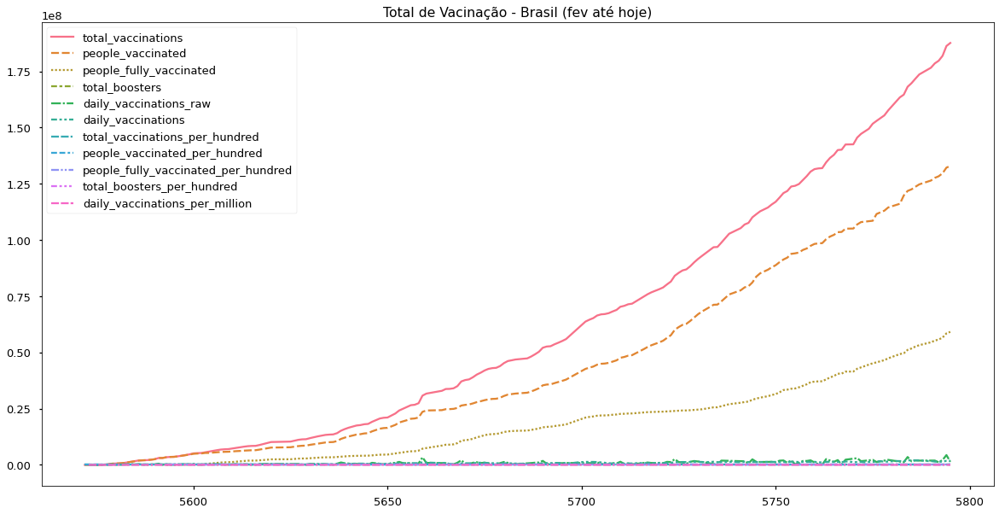

In [45]:
#Plotando dados total vacinado Brasil
plt.figure(figsize=(20,10))
sns.lineplot(data=brazil.loc['2021-02-22':])
plt.title('Total de Vacinação - Brasil (fev até hoje)')
plt.show()

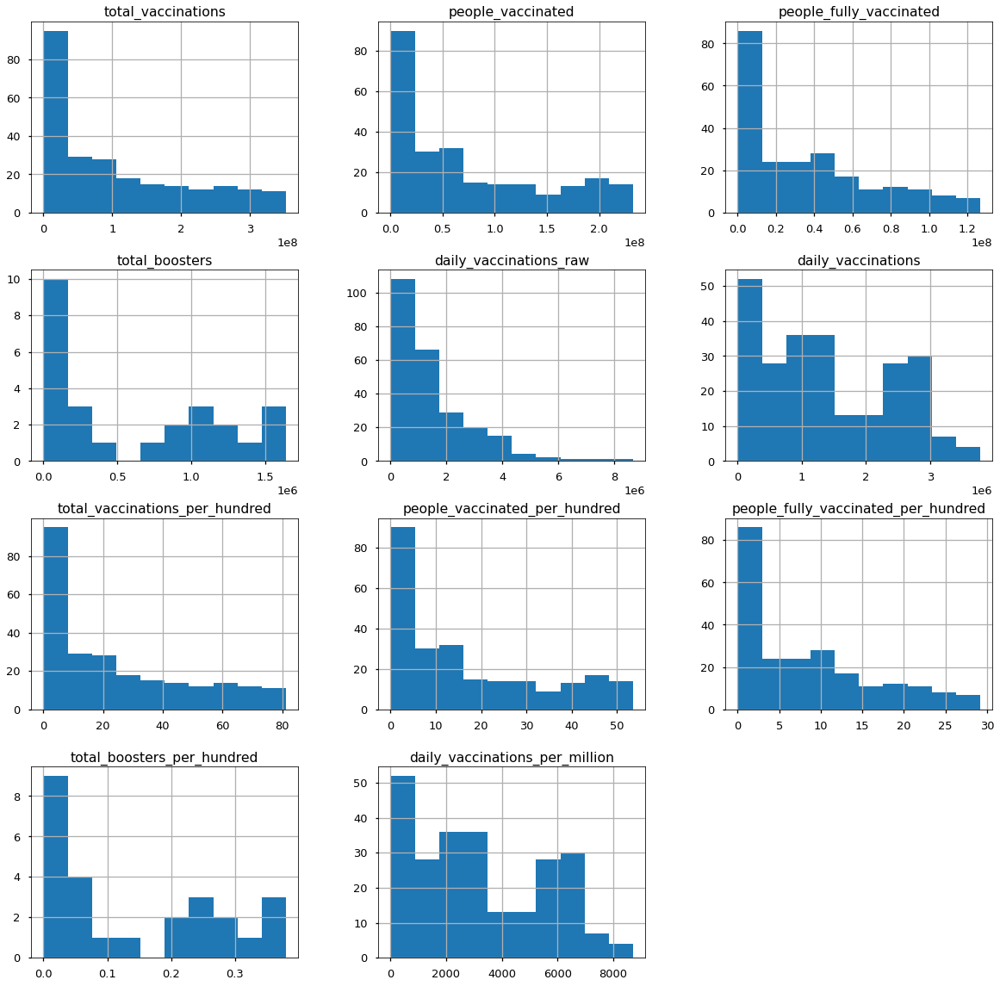

In [46]:
#Histograma América do Sul
south_america.hist(figsize=(20,20))
plt.show()

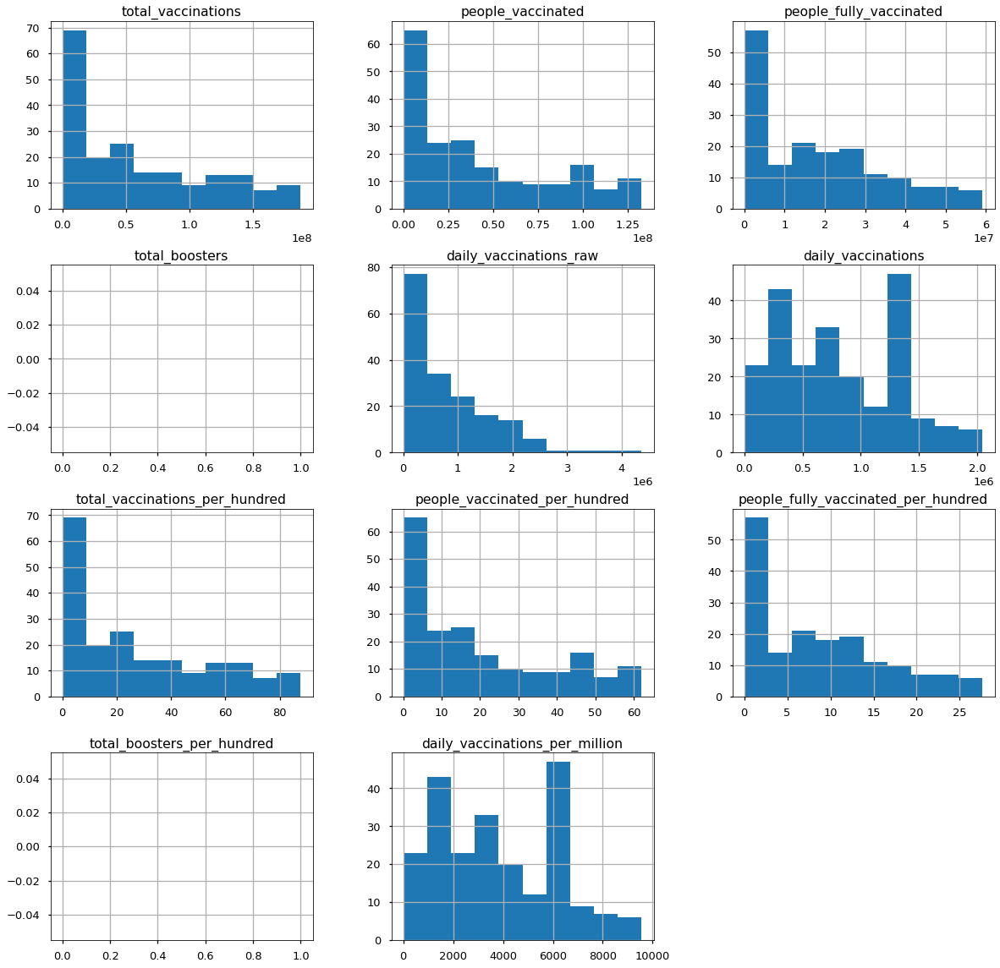

In [47]:
#Histograma Brasil
brazil.hist(figsize=(20,20))
plt.show()